# Combined model

To segment and detect plastic in rivers
- Segmentation
- Classification

## Segmentation

In [1]:
import supervision as sv
import numpy as np
import cv2
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [2]:
import torch

In [3]:
from FastSAM.fastsam import FastSAM, FastSAMPrompt
fast_sam = FastSAM("models/FastSAM.pt")

In [4]:
def getObjects(image_path, segmentationModel=fast_sam, conf=0.3, iou=0.1, point=None):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    results = segmentationModel(
        source=image_path,
        device=device,
        retina_masks=True,
        conf=conf,
        iou=iou
    )
    prompt_process = FastSAMPrompt(image_path, results, device=device)
    if point:
        ann = prompt_process.point_prompt(points=[point], pointlabel=[1])
        return ann
    else:
        return prompt_process.everything_prompt()

In [16]:
img_path = "../KILI_COCO/batch_1/000003.jpg"
masks = getObjects(img_path)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 34 objects, 2670.5ms
Speed: 3.9ms preprocess, 2670.5ms inference, 251.2ms postprocess per image at shape (1, 3, 1024, 1024)


In [5]:
def annotate_image(image_path: str, masks: np.ndarray) -> np.ndarray:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

    xyxy = sv.mask_to_xyxy(masks=masks)
    detections = sv.Detections(xyxy=xyxy, mask=masks)

    mask_annotator = sv.MaskAnnotator()
    return mask_annotator.annotate(scene=image, detections=detections)

In [6]:
def showMasks(image_path, masks):
    if not isinstance(masks, np.ndarray):
        masks = masks.numpy().astype(bool)
    annotated_image=annotate_image(image_path=image_path, masks=masks)
    sv.plot_image(image=annotated_image, size=(8, 8))

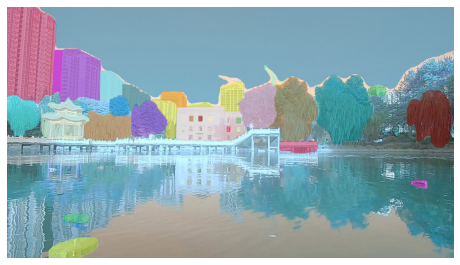

In [17]:
showMasks(img_path, masks)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test4.jpg: 704x1024 52 objects, 3022.8ms
Speed: 5.0ms preprocess, 3022.8ms inference, 506.6ms postprocess per image at shape (1, 3, 1024, 1024)


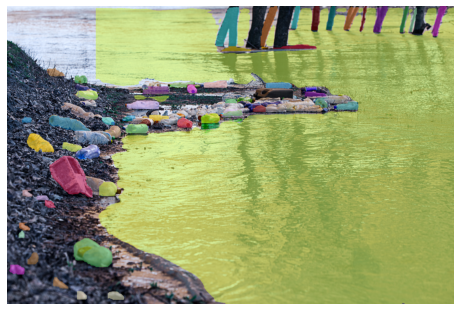

In [338]:
img_path = "../Images/test4.jpg"
showMasks(img_path, getObjects(img_path, conf=0.4, iou=0.01))

In [417]:
res = getObjects(img_path, point=[32, 32])


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\dataset5\plastic\10.jpg: 1024x1024 5 objects, 4587.5ms
Speed: 15.3ms preprocess, 4587.5ms inference, 9.6ms postprocess per image at shape (1, 3, 1024, 1024)


In [431]:
img_path = "./dataset5/plastic/1000.jpg"
showMasks(img_path, getObjects(img_path))

IndexError: list index out of range

In [18]:
masks.shape

torch.Size([34, 720, 1280])

Masks to bounding boxes

In [30]:
from torchvision.ops import masks_to_boxes

In [21]:
masks_to_boxes(masks)

tensor([[   0.,    0.,  139.,  279.],
        [ 159.,  594.,  237.,  620.],
        [ 611.,  216.,  678.,  302.],
        [  94.,    0., 1279.,  280.],
        [ 220.,  302.,  355.,  383.],
        [ 132.,  122.,  268.,  273.],
        [ 266.,  185.,  341.,  270.],
        [1156.,  498., 1204.,  521.],
        [ 119.,  661.,  259.,  719.],
        [ 485.,  279.,  684.,  384.],
        [ 330.,  224.,  411.,  300.],
        [ 131.,  122.,  409.,  298.],
        [ 664.,  203.,  889.,  384.],
        [  98.,  266.,  235.,  379.],
        [1145.,  241., 1272.,  404.],
        [ 736.,  169.,  772.,  229.],
        [ 780.,  385.,  889.,  419.],
        [1034.,  227., 1085.,  256.],
        [ 417.,  245.,  514.,  378.],
        [ 293.,  255.,  349.,  314.],
        [ 440.,  244.,  514.,  289.],
        [ 356.,  270.,  458.,  377.],
        [   0.,  256.,   91.,  371.],
        [ 130.,  125.,  158.,  250.],
        [ 519.,  275.,  589.,  288.],
        [ 266.,  185.,  411.,  299.],
        [ 88

Convert bounding box information to resizes 64x64 images

In [8]:
from skimage import io

In [7]:
def getBatchesImages(image_path, masks, imsize=64, padding=3):
    
    # reading RGB image
    image = io.imread(image_path)
    
    # empty batch
    batch = np.empty((len(masks), imsize, imsize, 3))
    
    bboxes = masks_to_boxes(masks)
    
    for i, bbox in enumerate(bboxes):
        cx, cy = (bbox[0]+bbox[2]).item()//2, (bbox[1]+bbox[3]).item()//2
        w, h = (bbox[2]-bbox[0]).item(), (bbox[3]-bbox[1]).item()
        
        max_dim = int(max(w, h))
        x, y = int((max(cx - max_dim//2 - padding, 0))), int(max(cy - max_dim//2 - padding, 0))
        # print(cx, cy, x, y, max_dim, bbox)
        img_temp = image[y:y+max_dim+padding, x:x+max_dim+padding, :]
            
        # xmin, ymin, xmax, ymax = bbox.numpy().astype("int")
        # print(xmin, ymin, xmax, ymax)
        # img_temp = image[ymin:ymax, xmin:xmax]

        # print(img_temp.shape)
        img_temp = cv2.resize(img_temp, (imsize, imsize), interpolation=cv2.INTER_CUBIC)
        
        batch[i] = img_temp
        
    return batch

In [150]:
batches = getBatchesImages(img_path, masks)

In [9]:
import matplotlib.pyplot as plt

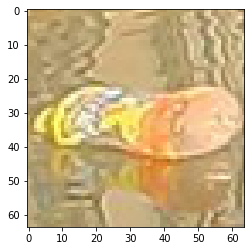

In [162]:
plt.imshow(batches[1]/255)

## Classifying objects

In [10]:
from torch import nn

In [11]:
class PlasticClassifier(nn.Module):
    def __init__(self):
        super(PlasticClassifier, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 64, 3),
            nn.ReLU(),
            nn.Conv2d(64, 32, 3, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 16, 3, stride=2),
            nn.ReLU(),
            nn.Conv2d(16, 8, 3, stride=2),
            nn.ReLU()
        )
        
        self.linear_layers = nn.Sequential(
            nn.Linear(8*6*6, 128),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(64, 2),
        )
        
        
    def forward(self, x):
        out = self.conv_layers(x)
        out = nn.Flatten()(out)
        out = self.linear_layers(out)
        return out
    
model = PlasticClassifier()

In [12]:
plasticDetector = torch.load("models/plasticDetector.pt")

In [160]:
pred = plasticDetector(torch.tensor(batches[1]/255).permute(2, 0, 1).unsqueeze(0).float())
pred

tensor([[-0.0723,  0.1800]], grad_fn=<AddmmBackward0>)

In [161]:
torch.argmax(torch.softmax(pred, dim=1), dim=1), torch.softmax(pred, dim=1)

(tensor([1]), tensor([[0.4373, 0.5627]], grad_fn=<SoftmaxBackward0>))

In [173]:
torch.argmax(torch.softmax(plasticDetector(torch.tensor(batches/255).permute(0, 3, 1, 2).float()), dim=1), dim=1)

tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1])

In [267]:
torch.softmax(plasticDetector(torch.tensor(batches/255).permute(0, 3, 1, 2).float()), dim=1)

tensor([[1.0000e+00, 7.0918e-10],
        [4.3726e-01, 5.6274e-01],
        [9.9936e-01, 6.4164e-04],
        [1.0000e+00, 1.7647e-08],
        [9.9972e-01, 2.8205e-04],
        [9.9952e-01, 4.7836e-04],
        [9.9785e-01, 2.1502e-03],
        [1.5610e-01, 8.4390e-01],
        [7.0834e-01, 2.9166e-01],
        [1.0000e+00, 1.9630e-06],
        [9.9952e-01, 4.8417e-04],
        [1.0000e+00, 3.9865e-07],
        [1.0000e+00, 1.7188e-06],
        [1.0000e+00, 3.2558e-08],
        [1.0000e+00, 1.1491e-06],
        [9.9360e-01, 6.3994e-03],
        [9.4914e-01, 5.0858e-02],
        [1.0000e+00, 1.3623e-06],
        [9.9999e-01, 7.0248e-06],
        [9.9996e-01, 3.9557e-05],
        [9.9936e-01, 6.3737e-04],
        [9.9698e-01, 3.0157e-03],
        [1.0000e+00, 1.1662e-09],
        [1.0000e+00, 2.6499e-06],
        [9.9999e-01, 7.2889e-06],
        [9.9997e-01, 3.3775e-05],
        [1.0000e+00, 7.5693e-08],
        [9.9999e-01, 9.8975e-06],
        [1.4715e-01, 8.5285e-01],
        [1.344

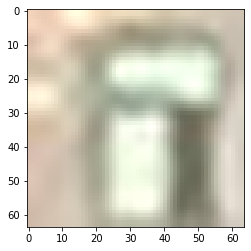

In [268]:
plt.imshow(batches[32]/255)

In [13]:
def batchesToPrediction(batches, classifierModel=plasticDetector):
    classifierModel.eval()
    with torch.inference_mode():
        batches = torch.tensor(batches).permute(0, 3, 1, 2).float()
        preds = classifierModel(batches)
        return torch.argmax(torch.softmax(preds, dim=1), dim=1)

In [190]:
bboxes = masks_to_boxes(masks)

In [181]:
batchesToPrediction(batches/255)

tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1])

In [187]:
masks.shape

torch.Size([34, 720, 1280])

In [193]:
bboxes[batchesToPrediction(batches/255)==1].shape

torch.Size([8, 4])

In [189]:
masks[batchesToPrediction(batches/255)==1].shape

torch.Size([8, 720, 1280])

## Combined model

In [14]:
def detectPlastic(image_path,
                  segmentationModel=fast_sam, 
                  classificationModel=plasticDetector,
                 padding=3,
                 conf=0.3,
                 iou=0.1):
    
    # get all objects
    masks = getObjects(image_path, segmentationModel, conf=conf, iou=iou)
    
    # get all batches
    bboxes = masks_to_boxes(masks)
    batches = getBatchesImages(image_path, masks, padding=padding)/255
    
    # predictions
    predictions = batchesToPrediction(batches, classificationModel)
    
    return {
        "bboxes": bboxes[predictions==1],
        "masks": masks[predictions==1]
    }

In [198]:
result = detectPlastic(img_path)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 34 objects, 2664.9ms
Speed: 5.0ms preprocess, 2664.9ms inference, 239.9ms postprocess per image at shape (1, 3, 1024, 1024)


In [200]:
result["bboxes"], len(result["masks"])

(tensor([[ 159.,  594.,  237.,  620.],
         [1156.,  498., 1204.,  521.],
         [ 522.,  314.,  533.,  329.],
         [ 575.,  314.,  587.,  329.],
         [ 548.,  314.,  559.,  329.],
         [ 657.,  345.,  668.,  359.],
         [ 629.,  344.,  639.,  359.],
         [ 657.,  320.,  669.,  334.]]),
 8)

In [29]:
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from torchvision.io import read_image

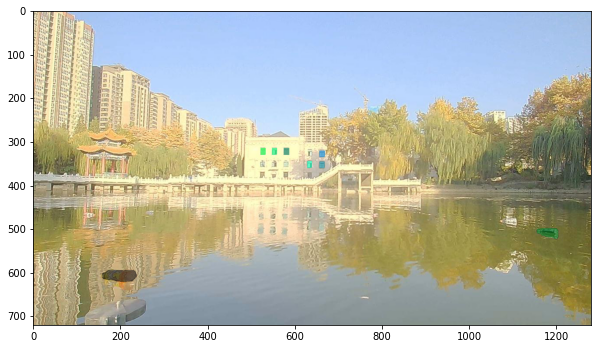

In [214]:
plt.figure(figsize=(10, 10))
plt.imshow(draw_segmentation_masks(read_image(img_path),
                                   result["masks"].bool(),
                                   alpha=0.6).permute(1,2,0).numpy())

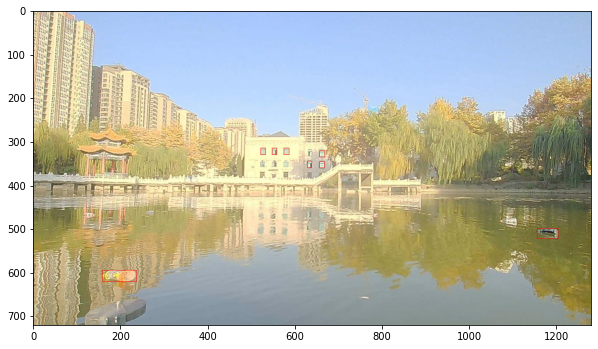

In [209]:
plt.figure(figsize=(10, 10))
plt.imshow(draw_bounding_boxes(read_image(img_path),
                               result["bboxes"],
                               colors="red").permute(1,2,0).numpy())

In [16]:
def showResult(image_path, results):
    plt.figure(figsize=(10, 10))
    img = read_image(image_path)
    
    img = draw_segmentation_masks(img,
                                   results["masks"].bool(),
                                   alpha=0.6)
    
    img = draw_bounding_boxes(img,
                               results["bboxes"],
                               colors="red")
    
    plt.imshow(img.permute(1,2,0).numpy())
    plt.axis("off")

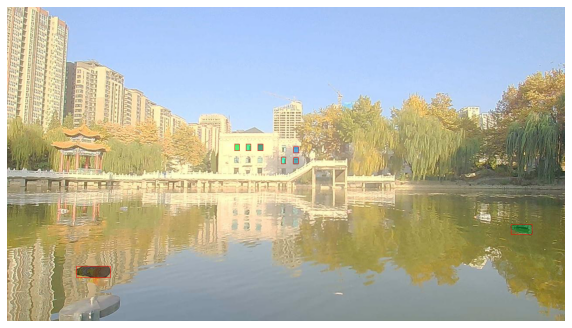

In [223]:
showResult(img_path, result)

## Out of sample test image

In [233]:
img_path2 = "../Images/test1.jpg"
result2 = detectPlastic(img_path2)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test1.jpg: 576x1024 195 objects, 2802.3ms
Speed: 7.0ms preprocess, 2802.3ms inference, 351.4ms postprocess per image at shape (1, 3, 1024, 1024)


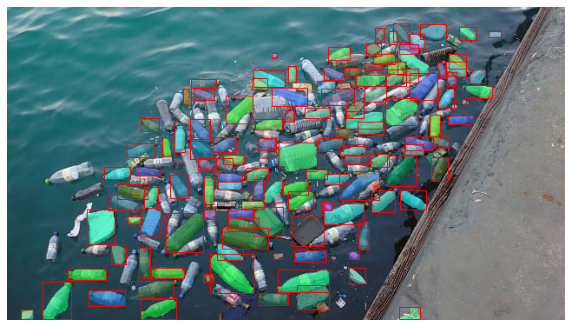

In [242]:
showResult(img_path2, result2)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003855.jpg: 576x1024 21 objects, 2863.9ms
Speed: 0.0ms preprocess, 2863.9ms inference, 141.0ms postprocess per image at shape (1, 3, 1024, 1024)


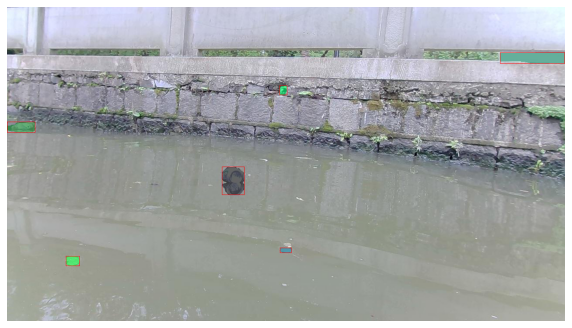

In [247]:
img_path2 = "../KILI_COCO/batch_10/003855.jpg"
showResult(img_path2, detectPlastic(img_path2))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test4.jpg: 704x1024 105 objects, 3560.4ms
Speed: 2.1ms preprocess, 3560.4ms inference, 926.7ms postprocess per image at shape (1, 3, 1024, 1024)


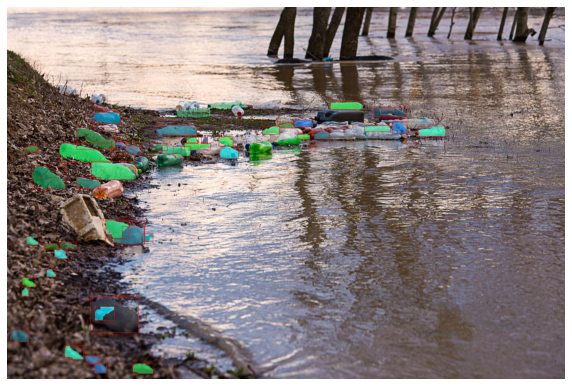

In [250]:
img_path2 = "../Images/test4.jpg"
showResult(img_path2, detectPlastic(img_path2))

Current problem is a lot of fasle positives

- imporve on the classifier

In [17]:
class PlasticClassifier2(nn.Module):
    def __init__(self):
        super(PlasticClassifier2, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, 5, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, 5),
            nn.ReLU(),
            nn.Conv2d(64, 86, 3, stride=2),
            nn.ReLU(),
            nn.Conv2d(86, 128, 3),
            nn.ReLU(),
            nn.Conv2d(128, 64, 1),
            nn.ReLU()
        )
        
        self.linear_layers = nn.Sequential(
            nn.Linear(64*10*10, 1024),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(512, 64),
            nn.ReLU(),
            nn.Linear(64, 2)
        )
        
        
        
    def forward(self, x):
        out = self.conv_layers(x)
        out = nn.Flatten()(out)
        out = self.linear_layers(out)
        return out

In [18]:
class PlasticClassifier4(nn.Module):
    def __init__(self):
        super(PlasticClassifier4, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 64, 3),
            nn.Dropout(),
            nn.ReLU(),
            nn.Conv2d(64, 32, 3, stride=2),
            nn.Dropout(),
            nn.ReLU(),
            nn.Conv2d(32, 16, 3, stride=2),
            nn.Dropout(),
            nn.ReLU(),
            nn.Conv2d(16, 8, 3, stride=2),
            nn.Dropout(),
            nn.ReLU()
        )
        
        self.linear_layers = nn.Sequential(
            nn.Linear(8*6*6, 128),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(64, 2),
        )
        
        
    def forward(self, x):
        out = self.conv_layers(x)
        out = nn.Flatten()(out)
        out = self.linear_layers(out)
        return out

In [19]:
class PlasticClassifier3(nn.Module):
    def __init__(self):
        super(PlasticClassifier3, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 128, 3),
            nn.ReLU(),
            nn.Conv2d(128, 64, 5),
            nn.ReLU(),
            nn.Conv2d(64, 32, 3),            
            nn.ReLU(),
            nn.Conv2d(32, 16, 3),
            nn.ReLU(),
            nn.Conv2d(16, 8, 3),
            nn.ReLU()
        )
        
        self.linear_layers = nn.Sequential(
            nn.Linear(8*52*52, 1024),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(1024, 256),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.Dropout(),
            nn.ReLU(),
            nn.Linear(64, 2)
        )
        
    def forward(self, x):
        out = self.conv_layers(x)
        out = nn.Flatten()(out)
        out = self.linear_layers(out)
        return out
    
# model3 = PlasticClassifier3()

In [36]:
plasticDetector2 = torch.load("models/plasticDetector2.pt")
plasticDetector3 = torch.load("models/plasticDetector3.pt")
plasticDetector4 = torch.load("models/plasticDetector4.pt")
plasticDetector5 = torch.load("models/plasticDetector5.pt")
plasticDetector6 = torch.load("models/plasticDetector6.pt")

In [20]:
plasticDetector7 = torch.load("models/plasticDetector7.pt")

In [270]:
torch.softmax(plasticDetector3(torch.tensor(batches/255).permute(0, 3, 1, 2).float()), dim=1)

tensor([[9.9928e-01, 7.1765e-04],
        [2.1141e-01, 7.8859e-01],
        [9.9665e-01, 3.3496e-03],
        [9.9980e-01, 2.0209e-04],
        [9.8944e-01, 1.0561e-02],
        [9.9192e-01, 8.0804e-03],
        [9.9769e-01, 2.3077e-03],
        [5.8212e-01, 4.1788e-01],
        [5.3054e-01, 4.6946e-01],
        [9.9361e-01, 6.3873e-03],
        [9.9753e-01, 2.4727e-03],
        [9.9983e-01, 1.6573e-04],
        [9.9994e-01, 6.1447e-05],
        [3.5132e-01, 6.4868e-01],
        [9.8907e-01, 1.0931e-02],
        [9.9924e-01, 7.6009e-04],
        [3.3918e-01, 6.6082e-01],
        [9.9675e-01, 3.2464e-03],
        [9.9640e-01, 3.5963e-03],
        [9.9278e-01, 7.2184e-03],
        [9.9974e-01, 2.5746e-04],
        [9.9756e-01, 2.4394e-03],
        [9.9688e-01, 3.1246e-03],
        [9.7501e-01, 2.4987e-02],
        [9.9945e-01, 5.4739e-04],
        [9.9972e-01, 2.8044e-04],
        [9.9971e-01, 2.9087e-04],
        [9.9906e-01, 9.4444e-04],
        [9.6667e-01, 3.3332e-02],
        [9.679


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 34 objects, 2818.4ms
Speed: 0.0ms preprocess, 2818.4ms inference, 229.8ms postprocess per image at shape (1, 3, 1024, 1024)


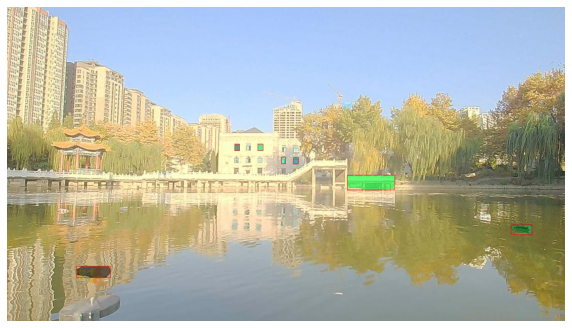

In [289]:
img_path2 = "../KILI_COCO/batch_1/000003.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector2, padding=10))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 34 objects, 2721.8ms
Speed: 0.0ms preprocess, 2721.8ms inference, 252.3ms postprocess per image at shape (1, 3, 1024, 1024)


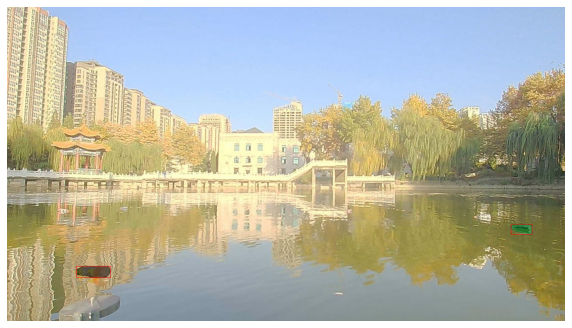

In [288]:
img_path2 = "../KILI_COCO/batch_1/000003.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector5, padding=10))

In [ ]:
img_path2 = "../KILI_COCO/batch_1/000003.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector5))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test4.jpg: 704x1024 105 objects, 3458.5ms
Speed: 8.5ms preprocess, 3458.5ms inference, 1128.5ms postprocess per image at shape (1, 3, 1024, 1024)


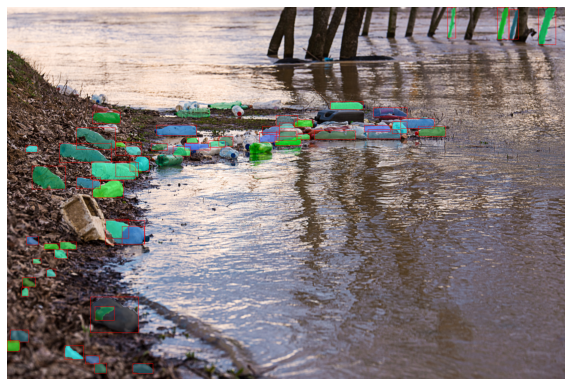

In [281]:
img_path2 = "../Images/test4.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector4))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000004.jpg: 576x1024 7 objects, 2784.3ms
Speed: 2.8ms preprocess, 2784.3ms inference, 55.1ms postprocess per image at shape (1, 3, 1024, 1024)
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:314: UserWarning: masks doesn't contain any mask. No mask was drawn
  warnings.warn("masks doesn't contain any mask. No mask was drawn")
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:210: UserWarning: boxes doesn't contain any box. No box was drawn
  warnings.warn("boxes doesn't contain any box. No box was drawn")


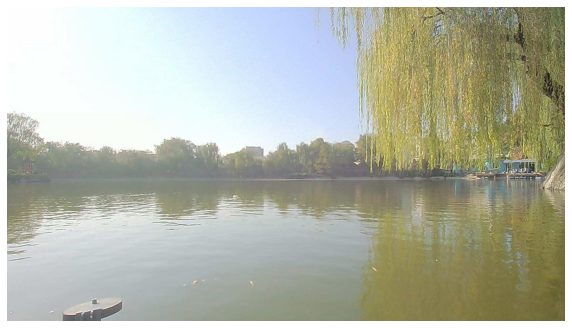

In [275]:
img_path2 = "../KILI_COCO/batch_1/000004.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector4))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003408.jpg: 576x1024 6 objects, 3753.0ms
Speed: 7.7ms preprocess, 3753.0ms inference, 47.1ms postprocess per image at shape (1, 3, 1024, 1024)


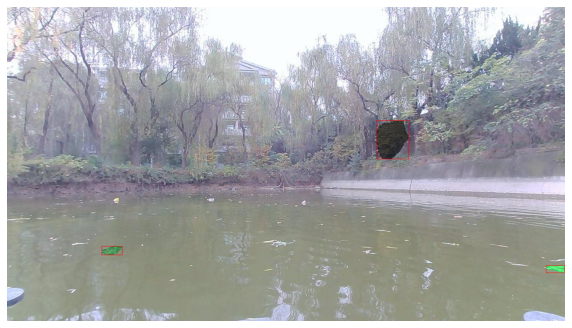

In [371]:
img_path2 = "../KILI_COCO/batch_9/003408.jpg"
showResult(img_path2, detectPlastic(
    img_path2, 
    classificationModel=plasticDetector3,
    conf=0.4,
    iou=0.4
))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000004.jpg: 576x1024 7 objects, 2824.4ms
Speed: 8.0ms preprocess, 2824.4ms inference, 46.9ms postprocess per image at shape (1, 3, 1024, 1024)
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:314: UserWarning: masks doesn't contain any mask. No mask was drawn
  warnings.warn("masks doesn't contain any mask. No mask was drawn")
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:210: UserWarning: boxes doesn't contain any box. No box was drawn
  warnings.warn("boxes doesn't contain any box. No box was drawn")


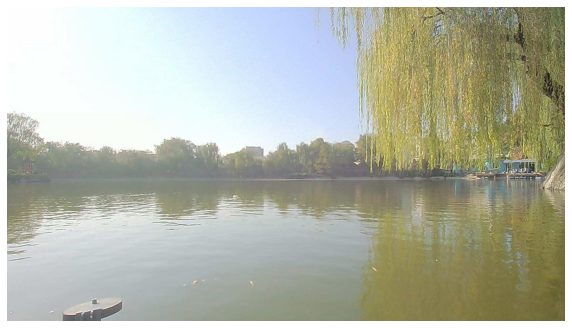

In [290]:
img_path2 = "../KILI_COCO/batch_1/000004.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector5, padding=10))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003408.jpg: 576x1024 7 objects, 2676.2ms
Speed: 6.0ms preprocess, 2676.2ms inference, 46.9ms postprocess per image at shape (1, 3, 1024, 1024)


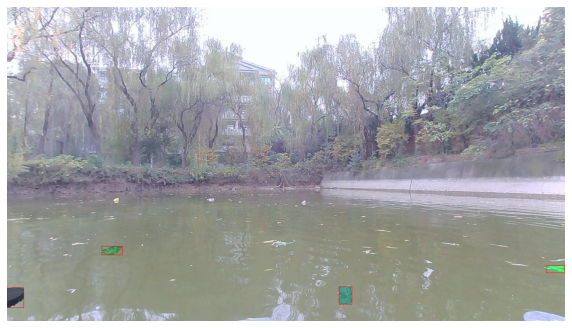

In [376]:
img_path2 = "../KILI_COCO/batch_9/003408.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector6, padding=10))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test2.jpg: 448x1024 31 objects, 1975.3ms
Speed: 0.0ms preprocess, 1975.3ms inference, 94.5ms postprocess per image at shape (1, 3, 1024, 1024)


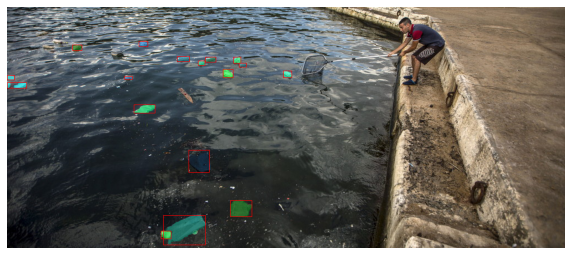

In [381]:
img_path2 = "../Images/test2.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector6))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 27 objects, 2884.8ms
Speed: 6.0ms preprocess, 2884.8ms inference, 174.5ms postprocess per image at shape (1, 3, 1024, 1024)


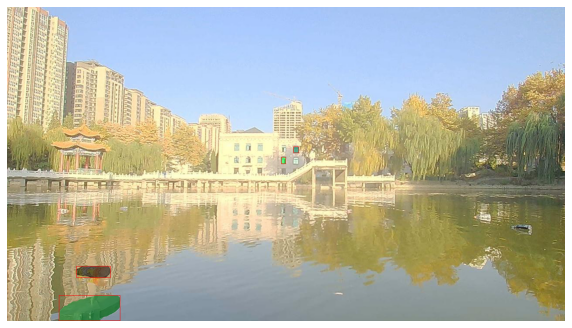

In [385]:
img_path2 = "../KILI_COCO/batch_1/000003.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector6))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000001.jpg: 576x1024 15 objects, 2843.5ms
Speed: 15.5ms preprocess, 2843.5ms inference, 94.4ms postprocess per image at shape (1, 3, 1024, 1024)


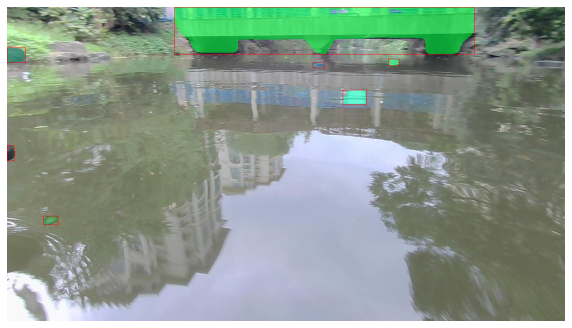

In [ ]:
img_path2 = "../KILI_COCO/batch_1/000001.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector, padding=5))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test1.jpg: 576x1024 148 objects, 2606.7ms
Speed: 5.5ms preprocess, 2606.7ms inference, 273.9ms postprocess per image at shape (1, 3, 1024, 1024)


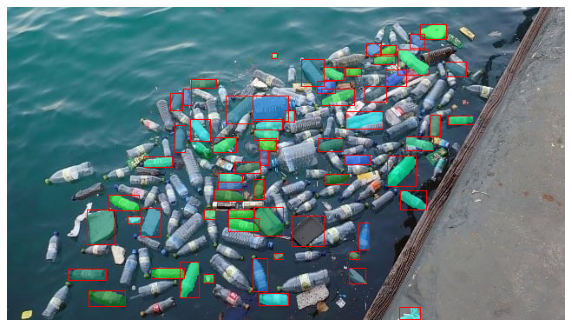

In [433]:
img_path2 = "../Images/test1.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector7))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test2.jpg: 448x1024 31 objects, 2114.6ms
Speed: 4.0ms preprocess, 2114.6ms inference, 96.4ms postprocess per image at shape (1, 3, 1024, 1024)


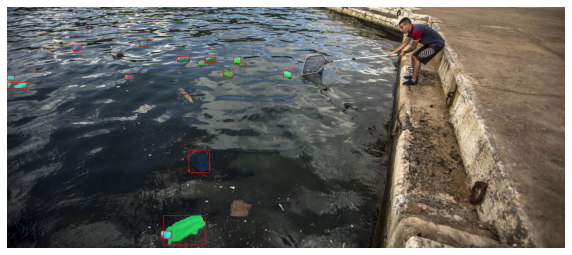

In [399]:
img_path2 = "../Images/test2.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector7))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\test5.jpg: 704x1024 23 objects, 3339.8ms
Speed: 0.0ms preprocess, 3339.8ms inference, 125.3ms postprocess per image at shape (1, 3, 1024, 1024)
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:314: UserWarning: masks doesn't contain any mask. No mask was drawn
  warnings.warn("masks doesn't contain any mask. No mask was drawn")
C:\Users\Ankush\anaconda3\lib\site-packages\torchvision\utils.py:210: UserWarning: boxes doesn't contain any box. No box was drawn
  warnings.warn("boxes doesn't contain any box. No box was drawn")


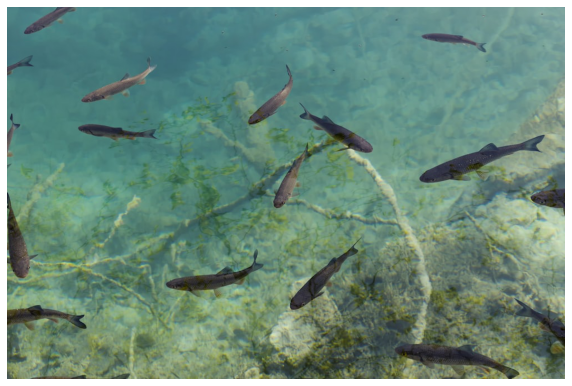

In [401]:
img_path2 = "../Images/test5.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector7))

In [23]:
detectPlastic(img_path2, classificationModel=plasticDetector7)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000002.jpg: 576x1024 10 objects, 2785.0ms
Speed: 6.0ms preprocess, 2785.0ms inference, 76.5ms postprocess per image at shape (1, 3, 1024, 1024)


{'bboxes': tensor([[ 992.,  497., 1015.,  511.]]),
 'masks': tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]])}


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000011.jpg: 576x1024 21 objects, 2783.6ms
Speed: 14.0ms preprocess, 2783.6ms inference, 157.6ms postprocess per image at shape (1, 3, 1024, 1024)


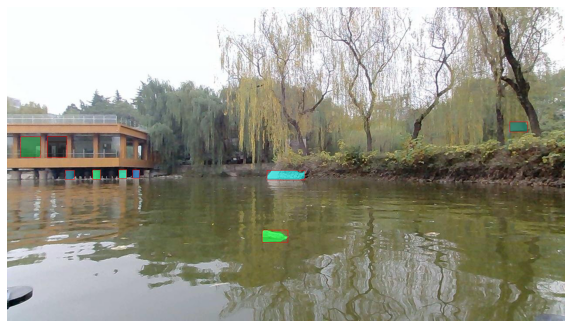

In [46]:
img_path2 = "../KILI_COCO/batch_1/000011.jpg"
showResult(img_path2, detectPlastic(img_path2, classificationModel=plasticDetector7))

In [67]:
full=json.load(open("../full_annotations.json", "r"))

In [68]:
import random

In [78]:
full["images"] = full["images"][:4000]

In [27]:
def getRandomImages(data, k=50, prefix="../"):
    files = random.choices(data["images"], k=k)
    paths = []
    for f in files:
        path = f"{prefix}{f['file_name']}"
        annotations = []
        for a in data["annotations"]:
            if a["image_id"] == f["id"]:
                annotations.append(a["bbox"])
        paths.append((path, annotations))
        
    return paths

In [151]:
test_images = getRandomImages(full)

In [83]:
test_images

[('../KILI_COCO/batch_6/002161.jpg', [[184.0, 296.0, 54.0, 17.0]]),
 ('../KILI_COCO/batch_4/001473.jpg',
  [[129.0, 492.0, 111.0, 44.0],
   [121.0, 361.0, 28.0, 10.0],
   [730.0, 347.0, 28.0, 9.0],
   [741.0, 339.0, 20.0, 7.0],
   [635.0, 336.0, 19.0, 8.0],
   [658.0, 337.0, 17.0, 8.0],
   [891.0, 333.0, 20.0, 7.0],
   [715.0, 339.0, 17.0, 7.0],
   [795.0, 335.0, 17.0, 5.0],
   [756.0, 327.0, 12.0, 5.0],
   [694.0, 345.0, 8.0, 5.0]]),
 ('../KILI_COCO/batch_2/000829.jpg',
  [[754.0, 438.0, 35.0, 16.0], [639.0, 447.0, 24.0, 15.0]]),
 ('../KILI_COCO/batch_7/002730.jpg', [[789.0, 494.0, 86.0, 43.0]]),
 ('../KILI_COCO/batch_2/000821.jpg', [[567.0, 495.0, 30.0, 13.0]]),
 ('../KILI_COCO/batch_3/000992.jpg',
  [[287.0, 669.0, 39.0, 46.0],
   [719.0, 362.0, 30.0, 35.0],
   [412.0, 257.0, 25.0, 28.0],
   [376.0, 465.0, 18.0, 18.0]]),
 ('../KILI_COCO/batch_3/001135.jpg', [[280.0, 435.0, 19.0, 7.0]]),
 ('../KILI_COCO/batch_6/002379.jpg', []),
 ('../KILI_COCO/batch_1/000133.jpg',
  [[1214.0, 448.0,

In [26]:
import torchvision.ops.boxes as bops

In [89]:
bops.box_iou(torch.tensor([[992.,  497., 1015.,  511.]]), 
             torch.tensor([[992.,  497., 1015.,  511.]])).item()

1.0

In [28]:
def testMetrics(model, images, iou_thres=0.01):
    
    # tp, fp, fn, tn
    TP = 0
    FN = 0
    FP = 0
    
    TP_area = 0
    FN_area = 0
    
    for i, (image, bboxes) in enumerate(images):
        pred_boxes = detectPlastic(image, classificationModel=model)["bboxes"];
        # showResult(image, res)
        detections = 0
        # for every actual check if a match is found
        for bbox in bboxes:
            detected = False
            # if bbox[2] < 20 or bbox[3] < 20:
            #     continue
            bbox = [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]
            for pred in pred_boxes:
                # xmin, ymin, xmax, ymax
                iou = bops.box_iou(
                    torch.tensor([bbox]).float(),
                    pred.unsqueeze(0)).item()
                # print(bbox, pred, iou)
                if iou > iou_thres:
                    TP += 1
                    detections += 1
                    detected = True
                    break
            
            if detected == False:
                FN += 1
        
        FP += max(len(pred_boxes) - detections, 0)
        print(f"Image {i}: {TP, FN, FP}")
        
    return [TP, FN, FP]
    


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\001133.jpg: 576x1024 17 objects, 2779.6ms
Speed: 0.0ms preprocess, 2779.6ms inference, 94.2ms postprocess per image at shape (1, 3, 1024, 1024)


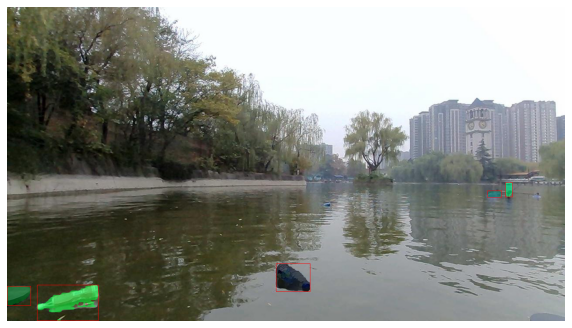

In [176]:
img_path = test_images[39][0]
showResult(img_path, detectPlastic(img_path, classificationModel=plasticDetector7));

In [182]:
model2_res = testMetrics(plasticDetector2, test_images)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001282.jpg: 576x1024 42 objects, 2717.4ms
Speed: 7.0ms preprocess, 2717.4ms inference, 294.0ms postprocess per image at shape (1, 3, 1024, 1024)



Image 0: (7, 2, 19)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_7\002559.jpg: 576x1024 47 objects, 2674.8ms
Speed: 2.1ms preprocess, 2674.8ms inference, 313.0ms postprocess per image at shape (1, 3, 1024, 1024)



Image 1: (14, 2, 39)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003024.jpg: 576x1024 32 objects, 2830.0ms
Speed: 7.2ms preprocess, 2830.0ms inference, 200.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 2: (16, 2, 47)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000111.jpg: 576x1024 24 objects, 2694.9ms
Speed: 8.6ms preprocess, 2694.9ms inference, 165.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 3: (17, 2, 56)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_6\002208.jpg: 576x1024 17 objects, 2859.3ms
Speed: 6.1ms preprocess, 2859.3ms inference, 109.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 4: (20, 4, 58)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003369.jpg: 576x1024 18 objects, 2829.8ms
Speed: 7.3ms preprocess, 2829.8ms inference, 101.0ms postprocess per image at shape (1, 3, 1024, 1024)



Image 5: (20, 4, 60)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003721.jpg: 576x1024 15 objects, 2891.5ms
Speed: 0.0ms preprocess, 2891.5ms inference, 102.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 6: (20, 5, 60)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001426.jpg: 576x1024 21 objects, 2694.7ms
Speed: 6.3ms preprocess, 2694.7ms inference, 155.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 7: (22, 7, 62)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003309.jpg: 576x1024 39 objects, 2866.7ms
Speed: 7.1ms preprocess, 2866.7ms inference, 343.6ms postprocess per image at shape (1, 3, 1024, 1024)



Image 8: (23, 7, 79)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003967.jpg: 576x1024 19 objects, 2924.4ms
Speed: 8.7ms preprocess, 2924.4ms inference, 126.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 9: (24, 8, 83)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003530.jpg: 576x1024 41 objects, 2713.7ms
Speed: 5.5ms preprocess, 2713.7ms inference, 270.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 10: (26, 8, 109)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_2\000461.jpg: 576x1024 6 objects, 2868.8ms
Speed: 0.2ms preprocess, 2868.8ms inference, 50.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 11: (26, 9, 112)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003243.jpg: 576x1024 24 objects, 3031.6ms
Speed: 8.2ms preprocess, 3031.6ms inference, 156.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 12: (27, 9, 122)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001698.jpg: 576x1024 17 objects, 2827.4ms
Speed: 9.0ms preprocess, 2827.4ms inference, 109.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 13: (27, 10, 128)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001624.jpg: 512x1024 13 objects, 2582.7ms
Speed: 8.7ms preprocess, 2582.7ms inference, 79.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 14: (27, 11, 131)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\000947.jpg: 512x1024 8 objects, 2481.5ms
Speed: 6.1ms preprocess, 2481.5ms inference, 46.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 15: (27, 12, 133)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000117.jpg: 576x1024 16 objects, 2670.1ms
Speed: 6.0ms preprocess, 2670.1ms inference, 102.0ms postprocess per image at shape (1, 3, 1024, 1024)



Image 16: (29, 13, 141)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003921.jpg: 576x1024 33 objects, 2729.6ms
Speed: 0.0ms preprocess, 2729.6ms inference, 209.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 17: (31, 13, 146)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\000873.jpg: 576x1024 15 objects, 2886.5ms
Speed: 6.0ms preprocess, 2886.5ms inference, 94.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 18: (33, 13, 154)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_6\002284.jpg: 576x1024 11 objects, 2886.4ms
Speed: 1.2ms preprocess, 2886.4ms inference, 78.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 19: (35, 16, 154)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003925.jpg: 576x1024 49 objects, 2884.8ms
Speed: 5.1ms preprocess, 2884.8ms inference, 310.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 20: (36, 16, 166)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_2\000451.jpg: 576x1024 14 objects, 2893.2ms
Speed: 7.6ms preprocess, 2893.2ms inference, 205.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 21: (36, 19, 172)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003128.jpg: 576x1024 18 objects, 2714.2ms
Speed: 13.7ms preprocess, 2714.2ms inference, 217.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 22: (36, 26, 183)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003771.jpg: 576x1024 11 objects, 2894.2ms
Speed: 0.0ms preprocess, 2894.2ms inference, 78.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 23: (37, 28, 190)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003920.jpg: 512x1024 8 objects, 2709.2ms
Speed: 6.0ms preprocess, 2709.2ms inference, 47.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 24: (37, 31, 194)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003710.jpg: 576x1024 17 objects, 3015.7ms
Speed: 0.0ms preprocess, 3015.7ms inference, 110.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 25: (37, 32, 198)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003521.jpg: 576x1024 4 objects, 2810.5ms
Speed: 6.8ms preprocess, 2810.5ms inference, 31.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 26: (39, 32, 199)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_6\002356.jpg: 576x1024 13 objects, 2748.4ms
Speed: 5.0ms preprocess, 2748.4ms inference, 62.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 27: (40, 33, 203)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_8\003208.jpg: 576x1024 56 objects, 2810.1ms
Speed: 7.0ms preprocess, 2810.1ms inference, 391.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 28: (46, 44, 212)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000423.jpg: 576x1024 20 objects, 2821.5ms
Speed: 6.2ms preprocess, 2821.5ms inference, 125.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 29: (48, 45, 220)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001701.jpg: 576x1024 41 objects, 2698.0ms
Speed: 4.1ms preprocess, 2698.0ms inference, 564.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 30: (50, 68, 246)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003596.jpg: 576x1024 65 objects, 2750.8ms
Speed: 6.0ms preprocess, 2750.8ms inference, 994.0ms postprocess per image at shape (1, 3, 1024, 1024)



Image 31: (51, 74, 293)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003904.jpg: 576x1024 16 objects, 3016.5ms
Speed: 6.0ms preprocess, 3016.5ms inference, 117.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 32: (53, 74, 297)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_6\002543.jpg: 512x1024 20 objects, 2629.0ms
Speed: 6.0ms preprocess, 2629.0ms inference, 109.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 33: (54, 78, 310)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_6\002485.jpg: 576x1024 23 objects, 2760.4ms
Speed: 6.6ms preprocess, 2760.4ms inference, 307.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 34: (54, 99, 323)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\001222.jpg: 576x1024 36 objects, 2898.2ms
Speed: 7.0ms preprocess, 2898.2ms inference, 500.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 35: (55, 102, 346)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001633.jpg: 576x1024 16 objects, 3016.0ms
Speed: 6.0ms preprocess, 3016.0ms inference, 109.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 36: (56, 102, 351)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000185.jpg: 576x1024 29 objects, 2773.8ms
Speed: 5.8ms preprocess, 2773.8ms inference, 196.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 37: (56, 102, 366)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003898.jpg: 576x1024 44 objects, 3031.1ms
Speed: 6.0ms preprocess, 3031.1ms inference, 299.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 38: (58, 102, 378)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\001133.jpg: 576x1024 17 objects, 2951.2ms
Speed: 7.9ms preprocess, 2951.2ms inference, 86.6ms postprocess per image at shape (1, 3, 1024, 1024)



Image 39: (60, 104, 382)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_2\000840.jpg: 576x1024 25 objects, 2913.1ms
Speed: 5.0ms preprocess, 2913.1ms inference, 153.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 40: (63, 105, 391)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\000862.jpg: 576x1024 14 objects, 3025.8ms
Speed: 9.0ms preprocess, 3025.8ms inference, 94.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 41: (63, 105, 392)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001428.jpg: 576x1024 11 objects, 2910.4ms
Speed: 8.0ms preprocess, 2910.4ms inference, 78.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 42: (63, 106, 393)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_3\001024.jpg: 576x1024 37 objects, 3007.5ms
Speed: 0.0ms preprocess, 3007.5ms inference, 292.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 43: (63, 107, 406)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_9\003575.jpg: 512x1024 25 objects, 2626.7ms
Speed: 6.3ms preprocess, 2626.7ms inference, 141.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 44: (63, 109, 410)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_10\003961.jpg: 576x1024 13 objects, 2978.9ms
Speed: 15.6ms preprocess, 2978.9ms inference, 101.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 45: (66, 110, 414)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_5\002113.jpg: 576x1024 4 objects, 2874.6ms
Speed: 6.0ms preprocess, 2874.6ms inference, 30.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 46: (66, 112, 415)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000318.jpg: 576x1024 28 objects, 2872.6ms
Speed: 6.2ms preprocess, 2872.6ms inference, 185.6ms postprocess per image at shape (1, 3, 1024, 1024)



Image 47: (73, 112, 423)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_4\001692.jpg: 576x1024 32 objects, 2818.3ms
Speed: 6.0ms preprocess, 2818.3ms inference, 193.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 48: (75, 112, 430)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_2\000611.jpg: 576x1024 28 objects, 2729.8ms
Speed: 6.0ms preprocess, 2729.8ms inference, 184.1ms postprocess per image at shape (1, 3, 1024, 1024)


Image 49: (75, 112, 435)


In [180]:
model1_res, model7_res, model1_res2, model7_res2

([79, 108, 450], [74, 113, 409], [47, 37, 482], [45, 39, 438])

In [184]:
(79*0.39)/(0.153+0.39)

0.10988950276243094

# Holdout dataset

In [23]:
holdout_images = []
parent = "../Plastic-Bottles-Dataset-master/Plastic-Bottles-Dataset-master/"
for folder in os.listdir(parent):
    if not os.path.isdir(f"{parent}{folder}"):
        continue
    image_path, anns_path, *_ =  os.listdir(f"{parent}{folder}")
    image_path = f"{parent}{folder}/{image_path}"
    anns_path = f"{parent}{folder}/{anns_path}"
    Bs_data = BeautifulSoup(open(anns_path, "r").read(), "xml")
    bboxes = []
    for bbox in Bs_data.find_all("bndbox"):
        bboxes.append([
            float(bbox.find("xmin").get_text()),
            float(bbox.find("ymin").get_text()),
            float(bbox.find("xmax").get_text()),
            float(bbox.find("ymax").get_text())])
        
    holdout_images.append((image_path, bboxes))

In [22]:
from bs4 import BeautifulSoup

In [24]:
del holdout_images[10]

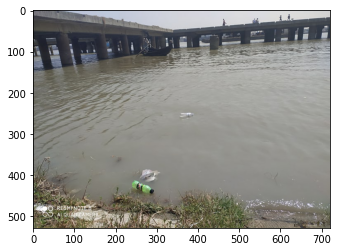

In [68]:
plt.imshow(io.imread(holdout_images[31][0]))

In [71]:
holdout_test = []
for i in [0, 1, 2, 4, 5, 6, 9, 11, 12, 13, 14, 20, 21, 25, 26, 29, 30, 31, 32]:
    holdout_test.append(holdout_images[i])


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\002-Cisadane River, Bogor, Indonesia-eka\IMG20200221125641.jpg: 480x1024 63 objects, 1965.9ms
Speed: 15.7ms preprocess, 1965.9ms inference, 3638.0ms postprocess per image at shape (1, 3, 1024, 1024)


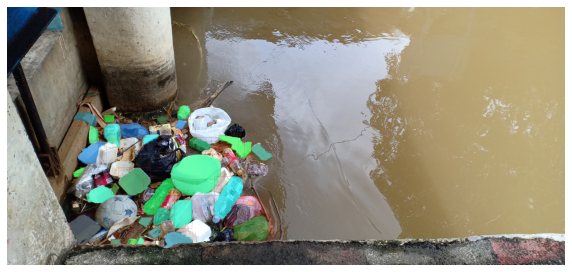

In [72]:
img_path = holdout_test[1][0]
showResult(img_path, detectPlastic(img_path, classificationModel=plasticDetector7));

In [226]:
del holdout_images[7]

In [75]:
model7_res_hold = testMetrics(plasticDetector7, holdout_test)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\001-Sindangbarang River, Bogor, Indonesia-eka\IMG20200218112536.jpg: 480x1024 73 objects, 2186.6ms
Speed: 0.0ms preprocess, 2186.6ms inference, 4235.6ms postprocess per image at shape (1, 3, 1024, 1024)



Image 0: (2, 2, 52)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\002-Cisadane River, Bogor, Indonesia-eka\IMG20200221125641.jpg: 480x1024 63 objects, 2386.8ms
Speed: 15.7ms preprocess, 2386.8ms inference, 3753.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 1: (10, 2, 75)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\003-india-bashir\20200222_133755.jpg: 768x1024 61 objects, 3338.9ms
Speed: 7.1ms preprocess, 3338.9ms inference, 4534.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 2: (13, 2, 91)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\005-nepal, Kathmandu-feb22img-sagar\IMG_20200222_143623.jpg: 1024x768 47 objects, 3514.1ms
Speed: 15.7ms preprocess, 3514.1ms inference, 3424.4ms postprocess per image at shape (1, 3, 1024, 1024)



Image 3: (13, 4, 104)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\006-Yazman Mandi, Pakistan-plasticbottles02-kashif\IMG_20200221_133258_1.jpg: 1024x640 9 objects, 3366.5ms
Speed: 0.0ms preprocess, 3366.5ms inference, 535.2ms postprocess per image at shape (1, 3, 1024, 1024)



Image 4: (18, 4, 106)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\007-lahore-pakistan-photosofplasticbottlesinriver-ansub\20200220_164341.jpg: 1024x576 22 objects, 2920.7ms
Speed: 15.6ms preprocess, 2920.7ms inference, 523.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 5: (18, 9, 117)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\010-Yazman Mandi, Pakistan-plasticbottles03-kashif\IMG_20200223_163617.jpg: 1024x768 9 objects, 3854.7ms
Speed: 15.6ms preprocess, 3854.7ms inference, 721.3ms postprocess per image at shape (1, 3, 1024, 1024)



Image 6: (19, 9, 121)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\013-lahore-pakistan-bottlepictures-ansub\20200220_164339.jpg: 1024x768 35 objects, 3926.3ms
Speed: 16.9ms preprocess, 3926.3ms inference, 2924.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 7: (21, 14, 136)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\014-Yazman Mandi, Pakistan-1stBatch-kashif\IMG_20200301_092632.jpg: 1024x768 2 objects, 3969.2ms
Speed: 7.5ms preprocess, 3969.2ms inference, 172.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 8: (22, 14, 136)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\015-Yazman Mandi, Pakistan-15PicsPlasticBottles-kashif\IMG_20200301_094403.jpg: 1024x768 5 objects, 3824.1ms
Speed: 15.6ms preprocess, 3824.1ms inference, 407.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 9: (23, 14, 138)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\016-india-bashir\20200226_153554.jpg: 768x1024 120 objects, 4103.2ms
Speed: 9.1ms preprocess, 4103.2ms inference, 32562.9ms postprocess per image at shape (1, 3, 1024, 1024)


Image 10: (24, 14, 170)



image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\022-Yazman Mandi, Pakistan-PlasticBottles04second-kashif\IMG_20200221_133233.jpg: 1024x704 6 objects, 4391.7ms
Speed: 21.2ms preprocess, 4391.7ms inference, 345.9ms postprocess per image at shape (1, 3, 1024, 1024)



Image 11: (25, 14, 171)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\023-india-plasticbottle3bash-bashir\20200304_162547.jpg: 768x1024 59 objects, 4227.6ms
Speed: 0.0ms preprocess, 4227.6ms inference, 4921.6ms postprocess per image at shape (1, 3, 1024, 1024)



Image 12: (27, 15, 190)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\027-nepal, Kathmandu-march02-4-sagar\IMG_20200302_164019.jpg: 1024x768 37 objects, 4350.8ms
Speed: 0.0ms preprocess, 4350.8ms inference, 3124.5ms postprocess per image at shape (1, 3, 1024, 1024)



Image 13: (30, 15, 213)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\028-nepal, Kathmandu-march08-sagar\IMG_20200307_181904.jpg: 1024x768 65 objects, 4046.8ms
Speed: 15.6ms preprocess, 4046.8ms inference, 5409.8ms postprocess per image at shape (1, 3, 1024, 1024)



Image 14: (30, 23, 237)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\031-bangladesh-location6-tarequl\10114.jpg: 640x1024 10 objects, 3508.3ms
Speed: 0.0ms preprocess, 3508.3ms inference, 330.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 15: (30, 25, 240)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\032-south khulshi-location7-tarequl\IMG_20200306_163225.jpg: 768x1024 42 objects, 4026.3ms
Speed: 15.6ms preprocess, 4026.3ms inference, 3344.7ms postprocess per image at shape (1, 3, 1024, 1024)



Image 16: (31, 26, 268)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\033-south khulshi-location8-tarequl\84119389_646896645878995_4311180913506516992_n.jpg: 768x1024 33 objects, 3787.5ms
Speed: 6.0ms preprocess, 3787.5ms inference, 94.1ms postprocess per image at shape (1, 3, 1024, 1024)



Image 17: (32, 28, 273)


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Plastic-Bottles-Dataset-master\Plastic-Bottles-Dataset-master\034-lahore-pakistan-plasticbottlepictures-ansub\20200312_164446.jpg: 1024x576 16 objects, 3026.0ms
Speed: 0.0ms preprocess, 3026.0ms inference, 384.1ms postprocess per image at shape (1, 3, 1024, 1024)


Image 18: (33, 31, 278)


In [76]:
model1_res_hold, model7_res_hold

([32, 32, 285], [33, 31, 278])

In [200]:
f1 = lambda p,r: 2*(p*r)/(p+r)

In [204]:
f1(.11,.51)

0.18096774193548387

YOLO holdout

In [152]:
yolos = torch.hub.load('ultralytics/yolov5', 'custom', path='../trained/yolon50binary.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\Ankush/.cache\torch\hub\master.zip
YOLOv5  2023-7-30 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
Adding AutoShape... 


In [92]:
res = model("../KILI_COCO/batch_1/000001.jpg")

In [116]:
res.xyxy[0][:, :4]

tensor([[6.99866e+02, 1.26952e+02, 7.29715e+02, 1.38318e+02],
        [8.73975e+02, 1.18955e+02, 9.00254e+02, 1.29502e+02],
        [5.23143e-02, 3.12042e+02, 1.60002e+01, 3.43256e+02]])

In [118]:
def testMetricsYOLO(model, images, iou_thres=0.01):
    
    # tp, fp, fn, tn
    TP = 0
    FN = 0
    FP = 0
    
    TP_area = 0
    FN_area = 0
    
    for i, (image, bboxes) in enumerate(images):
        pred_boxes = model(image).xyxy[0][:, :4];
        # showResult(image, res)
        detections = 0
        # for every actual check if a match is found
        for bbox in bboxes:
            detected = False
            # if bbox[2] < 20 or bbox[3] < 20:
            #     continue
            bbox = [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]
            for pred in pred_boxes:
                # xmin, ymin, xmax, ymax
                iou = bops.box_iou(
                    torch.tensor([bbox]).float(),
                    pred.unsqueeze(0)).item()
                # print(bbox, pred, iou)
                if iou > iou_thres:
                    TP += 1
                    detections += 1
                    detected = True
                    break
            
            if detected == False:
                FN += 1
        
        FP += max(len(pred_boxes) - detections, 0)
        print(f"Image {i}: {TP, FN, FP}")
        
    return [TP, FN, FP]
    

In [129]:
yolon_res_all = testMetricsYOLO(yolon, holdout_images)

Image 0: (0, 4, 0)
Image 1: (0, 12, 0)
Image 2: (0, 15, 0)
Image 3: (0, 20, 0)
Image 4: (0, 22, 0)
Image 5: (0, 27, 0)
Image 6: (0, 32, 0)
Image 7: (0, 34, 0)
Image 8: (0, 35, 0)
Image 9: (0, 36, 0)
Image 10: (0, 37, 0)
Image 11: (0, 44, 0)
Image 12: (1, 44, 0)
Image 13: (2, 44, 0)
Image 14: (2, 45, 0)
Image 15: (2, 71, 0)
Image 16: (2, 77, 0)
Image 17: (2, 82, 0)
Image 18: (2, 88, 0)
Image 19: (2, 90, 0)
Image 20: (2, 91, 0)
Image 21: (4, 92, 2)
Image 22: (4, 99, 3)
Image 23: (4, 116, 3)
Image 24: (4, 118, 3)
Image 25: (6, 119, 3)
Image 26: (6, 127, 3)
Image 27: (6, 129, 5)
Image 28: (6, 131, 5)
Image 29: (6, 133, 5)
Image 30: (6, 135, 5)
Image 31: (6, 138, 6)
Image 32: (8, 140, 6)


In [130]:
yolos_res, yolon_res, yolon_res_all, yolos_res_all

([5, 59, 5], [8, 56, 3], [8, 140, 6], [5, 143, 6])

In [213]:
f1(.45, .03)

0.05625

Images examples


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\torrens2.jpg: 1024x1024 3 objects, 5055.1ms
Speed: 15.6ms preprocess, 5055.1ms inference, 247.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\torrens5.jpg: 1024x1024 65 objects, 5125.2ms
Speed: 0.0ms preprocess, 5125.2ms inference, 5939.5ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\Images\torrens6.jpg: 1024x1024 43 objects, 5728.0ms
Speed: 15.5ms preprocess, 5728.0ms inference, 3409.1ms postprocess per image at shape (1, 3, 1024, 1024)


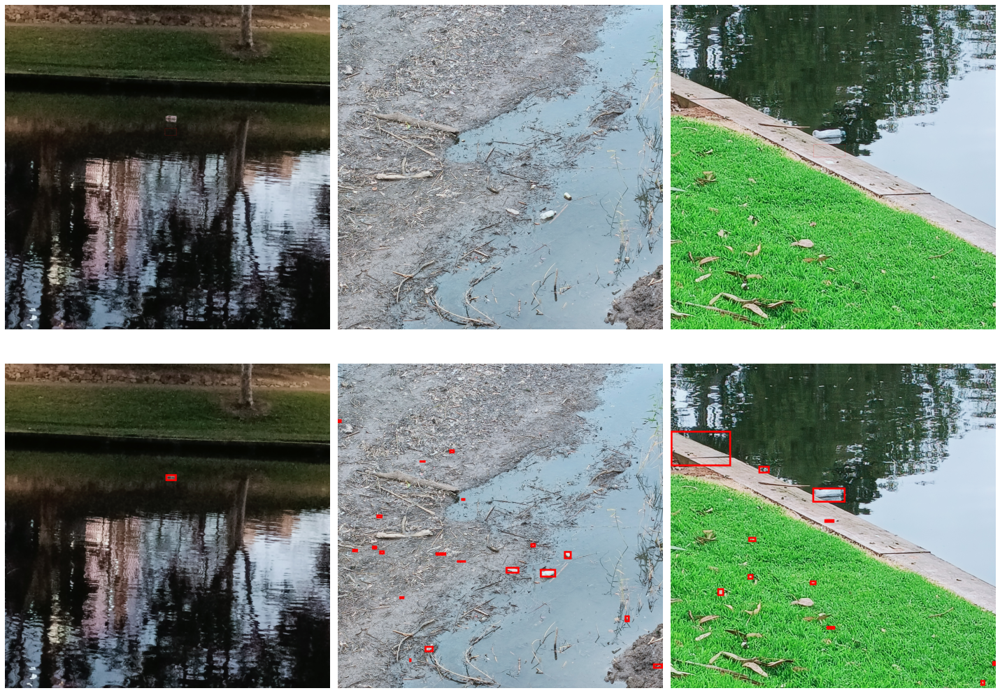

In [173]:
plt.figure(figsize=(20, 15))
plt.subplot(2, 3, 1)
plt.imshow(getYoloImage("../Images/torrens2.jpg"))
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(getYoloImage("../Images/torrens5.jpg"))
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(getYoloImage("../Images/torrens6.jpg"))
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(getSamImages("../Images/torrens2.jpg", 
           detectPlastic(
               "../Images/torrens2.jpg",
               classificationModel=plasticDetector)))
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(getSamImages("../Images/torrens5.jpg", 
           detectPlastic(
               "../Images/torrens5.jpg",
               classificationModel=plasticDetector)))
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(getSamImages("../Images/torrens6.jpg", 
           detectPlastic(
               "../Images/torrens6.jpg",
               classificationModel=plasticDetector, padding=10)))
plt.axis("off")


plt.tight_layout()
plt.savefig('results/img1.png')


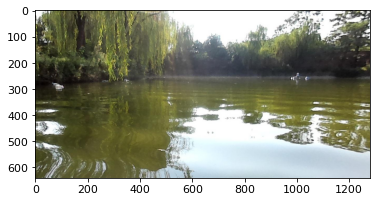

In [242]:
plt.imshow(io.imread("../KILI_COCO/batch_5/001715.jpg"))


image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000003.jpg: 576x1024 27 objects, 2866.6ms
Speed: 1.5ms preprocess, 2866.6ms inference, 182.4ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_1\000015.jpg: 512x1024 12 objects, 2528.7ms
Speed: 0.0ms preprocess, 2528.7ms inference, 78.1ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 C:\Users\Ankush\Desktop\Trimester-4\Big_Data_Project\Project\Modelv2\..\KILI_COCO\batch_5\001715.jpg: 512x1024 5 objects, 2603.8ms
Speed: 6.2ms preprocess, 2603.8ms inference, 31.2ms postprocess per image at shape (1, 3, 1024, 1024)


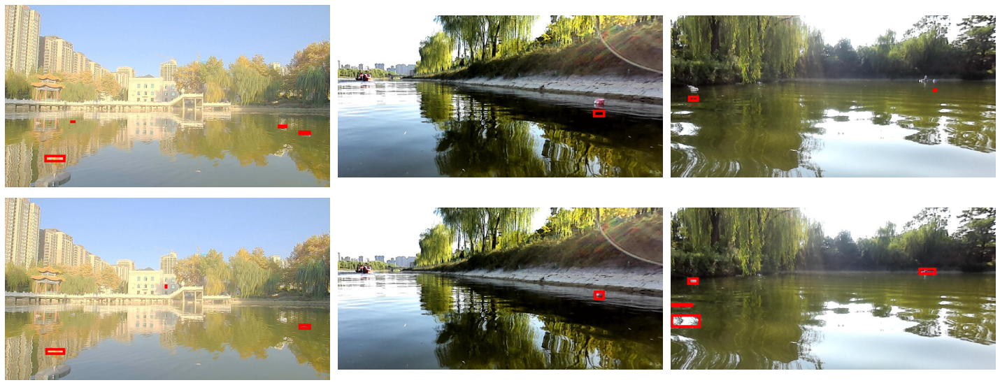

In [249]:
plt.figure(figsize=(20, 8))
plt.subplot(2, 3, 1)
plt.imshow(getYoloImage("../KILI_COCO/batch_1/000003.jpg"))
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(getYoloImage("../KILI_COCO/batch_1/000015.jpg"))
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(getYoloImage("../KILI_COCO/batch_5/001715.jpg"))
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(getSamImages("../KILI_COCO/batch_1/000003.jpg",
           detectPlastic(
               "../KILI_COCO/batch_1/000003.jpg",
               classificationModel=plasticDetector7, padding=10)))
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(getSamImages("../KILI_COCO/batch_1/000015.jpg", 
           detectPlastic(
               "../KILI_COCO/batch_1/000015.jpg",
               classificationModel=plasticDetector7)))
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(getSamImages("../KILI_COCO/batch_5/001715.jpg", 
           detectPlastic(
               "../KILI_COCO/batch_5/001715.jpg",
               classificationModel=plasticDetector7)))
plt.axis("off")


plt.tight_layout()
plt.savefig('results/img2.png')


In [134]:
import torchvision.io as tio

In [227]:
def getSamImages(img_path, results):
    img = tio.read_image(img_path)
    img = draw_bounding_boxes(img,
                               results["bboxes"],
                               colors="red",
                               width=10)
    
    return img.permute(1,2,0).numpy()

In [228]:
def getYoloImage(img_path, model=yolos):
    img = tio.read_image(img_path)
    imres = draw_bounding_boxes(img,
                       model(img_path).xyxy[0][:, :4],
                       colors="red",
                               width=10)

    return imres.detach().permute(1,2,0)

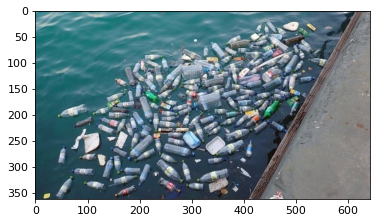

In [139]:
img = tio.read_image("../Images/test1.jpg")
imres = draw_bounding_boxes(img,
                   yolos("../Images/test1.jpg").xyxy[0][:, :4],
                   colors="red")

plt.imshow(imres.detach().permute(1,2,0))